## ***Análisis Exploratorio de Datos***

In [1]:
# Cargar librerias necesarias
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Cargar el dataset
df_siem = pd.read_csv('../data/processed/datos_siem_2024.csv')
df_siem.head()

,razon_social,estado,municipio,domicilio,colonia,giro,scian,rango_de_empleados,registrado_por
0,KINAM,México,Texcoco,Avenida HIDALGO 703 int 101-1,Colonia SAN SEBASTIAN,autotanques de acero al carbon,339999,11 a 50,CAMARA NACIONAL DE LA INDUSTRIA DE TRANSFORMACION
1,SANBORNS SUC PLAZA SAN PABLO TEXCOCO,México,Texcoco,Avenida JUÁREZ NTE 413 int -,Colonia CENTRO,restaurante,722511,0 a 10,CAMARA NACIONAL DE LA INDUSTRIA DE RESTAURANTE...
2,BURGER KING TEXCOCO,México,Texcoco,Avenida JUAREZ SUR 340 int -,Colonia SAN PEDRO,restaurante,722511,0 a 10,CAMARA NACIONAL DE LA INDUSTRIA DE RESTAURANTE...
3,ITALIANNIS,México,Texcoco,Calle MOLINO DE LAS FLORES S/N int -,Colonia SANTA CRUZ DE ARRIBA,restaurante,722511,0 a 10,CAMARA NACIONAL DE LA INDUSTRIA DE RESTAURANTE...
4,BURGER KING PUERTA TEXCOCO,México,Texcoco,Carretera MEXICO-TEXCOCO KM 30.5 int -,Colonia SANTIAGO CUAUTLALPAN,restaurante,722511,0 a 10,CAMARA NACIONAL DE LA INDUSTRIA DE RESTAURANTE...


In [3]:
pd.set_option('display.max_rows', None)

##### **Conteo de empresa por estado**

In [4]:
# Conteo de empresas por estado
estado_razon_social = df_siem.groupby(['estado'])['razon_social'].count()
print(f'{'Esatdo':<31}{'Cantidad':>20}')
for estado, cantidad_estado in estado_razon_social.items():
    print(f'{estado:<31}{cantidad_estado:>20}')

Esatdo                                     Cantidad
Aguascalientes                                  158
Baja California                                3344
Baja California Sur                            1833
Campeche                                        368
Chiapas                                        1473
Chihuahua                                      7611
Ciudad de México                              28245
Coahuila de Zaragoza                           4335
Colima                                          526
Durango                                        1980
Guanajuato                                     4812
Guerrero                                       1009
Hidalgo                                         997
Jalisco                                       11786
Michoacán de Ocampo                            3068
Morelos                                        1250
México                                        11072
Nayarit                                        1711
Nuevo León  

##### **Conteo de empresas por municipio**

In [5]:
municipio_razon_social = df_siem.groupby('municipio')['razon_social'].count()
print(f'{'Esatdo':<31}{'Cantidad':>20}')
for municipio, cantidad_municipio in municipio_razon_social.items():
    print(f'{municipio:<31}{cantidad_municipio:>20}')

Esatdo                                     Cantidad
Abalá                                            10
Abasolo                                          61
Acajete                                          13
Acambay de Ruíz Castañeda                         9
Acanceh                                          19
Acapetahua                                        2
Acaponeta                                         4
Acapulco de Juárez                              534
Acatic                                            1
Acatlán                                           9
Acatlán de Juárez                                13
Acatlán de Pérez Figueroa                         1
Acatzingo                                        21
Acaxochitlán                                      1
Acayucan                                         27
Acolman                                         164
Actopan                                          29
Aculco                                           14
Acultzingo  

##### **Conteo de empresas por sector**

In [6]:
sector_razon_social = df_siem.groupby('giro')['razon_social'].count()

ancho_total_linea = 80 # Puedes ajustar este valor según veas la salida

print("--- Conteo de Empresas por Sector (Giro) ---")

print(f"{'Giro':<{ancho_total_linea - 10}}{'Número':>10}") # Restamos 10 del ancho total para dejar espacio al número
print("-" * ancho_total_linea) # Línea separadora ajustada al ancho total

for nombre, valor in sector_razon_social.items():
    print(f'{nombre:<{ancho_total_linea - 10}}{valor:>10}')


print("-" * ancho_total_linea)

--- Conteo de Empresas por Sector (Giro) ---
Giro                                                                      Número
--------------------------------------------------------------------------------
3 comercio al por menor de ropa                                                1
8 comercio al por mayor de otras materias primas para otras industrias         1
Venta de ropa (excepto para bebé y lencería)                                   2
Venta de ropa de bonetería                                                     1
Venta de ropa de cuero                                                         1
Venta de ropa de lencería                                                      1
Venta de ropa de moda                                                          1
Venta de ropa de playa                                                         1
Venta de ropa de segunda mano                                                  1
Venta de ropa de uso médico                                     

##### ***Conteo de empresa por tamaño (cantidad de empleados)***

In [7]:
tamanio_razon_social = df_siem.groupby('rango_de_empleados')['razon_social'].count()
# tamanio_razon_social

print(f'{"Rango de Empleados":<20}{'Cantidad':>20}')
for rango_empleados, cantidad_tamanio in tamanio_razon_social.items():
    print(f'{rango_empleados:<20}{cantidad_tamanio:>20}')

Rango de Empleados              Cantidad
0 a 10                            125256
11 a 50                            17386
51 a 250                            3592
más de 250                           792


##### ***Proporciones relativas por Estado***

In [8]:
print("--- Proporciones Relativas por Estado ---")

# Primero, obtenemos los conteos por estado
empresas_por_estado = df_siem['estado'].value_counts()

# Calculamos el total de empresas
total_empresas = len(df_siem)

# Calculamos las proporciones
proporciones_estado = (empresas_por_estado / total_empresas) * 100

# Formateamos la salida para que se vea como porcentajes
print(f"{'Estado':<30}{'Número de Empresas':>20}{'Porcentaje (%)':>18}")
print("-" * 68)

for estado, conteo in empresas_por_estado.items():
    porcentaje = proporciones_estado[estado]
    print(f'{estado:<30}{conteo:>20}{porcentaje:>15.2f}%') # .2f para 2 decimales

print("-" * 68)
print(f"{'Total':<30}{total_empresas:>20}{proporciones_estado.sum():>15.2f}%") # La suma de porcentajes debería ser 100

--- Proporciones Relativas por Estado ---
Estado                          Número de Empresas    Porcentaje (%)
--------------------------------------------------------------------
Ciudad de México                             28245          19.21%
Nuevo León                                   18416          12.53%
Jalisco                                      11786           8.02%
México                                       11072           7.53%
Tamaulipas                                   10187           6.93%
Chihuahua                                     7611           5.18%
Veracruz de Ignacio de la Llave                7418           5.05%
Yucatán                                       6025           4.10%
Puebla                                        5038           3.43%
Guanajuato                                    4812           3.27%
Coahuila de Zaragoza                          4335           2.95%
Sinaloa                                       4044           2.75%
Baja California

##### ***Proporciones Relativas por Giro (Sector)***

In [9]:
print("\n--- Proporciones Relativas por Giro (Sector) ---")

# Primero, obtenemos los conteos por giro
empresas_por_giro = df_siem['giro'].value_counts()

# Calculamos las proporciones
proporciones_giro = (empresas_por_giro / total_empresas) * 100

# Ajustamos el ancho del nombre del giro para que se vea bien
max_ancho_giro = empresas_por_giro.index.astype(str).map(len).max()
ancho_giro_display = max(max_ancho_giro + 5, 40) # Aseguramos un ancho mínimo de 40

print(f"{'Giro':<{ancho_giro_display}}{'Número de Empresas':>20}{'Porcentaje (%)':>18}")
print("-" * (ancho_giro_display + 20 + 18))

for giro, conteo in empresas_por_giro.items():
    porcentaje = proporciones_giro[giro]
    print(f'{giro:<{ancho_giro_display}}{conteo:>20}{porcentaje:>15.2f}%')

print("-" * (ancho_giro_display + 20 + 18))
print(f"{'Total':<{ancho_giro_display}}{total_empresas:>20}{proporciones_giro.sum():>15.2f}%")


--- Proporciones Relativas por Giro (Sector) ---
Giro                                                                                                                                                                                                                                                                                        Número de Empresas    Porcentaje (%)
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
giro desconocido                                                                                                                                                                                                                                                                                         10892      

##### ***Proporciones Relativas por Estado y Municipio***

In [10]:
print("\n--- Proporciones Relativas por Estado y Municipio ---")

# Obtenemos los conteos por la combinación
conteo_estado_municipio = df_siem.groupby(['estado', 'municipio']).size()

# Calculamos las proporciones
proporciones_estado_municipio = (conteo_estado_municipio / total_empresas) * 100

# Convertimos a DataFrame para una mejor presentación
df_proporciones_em = proporciones_estado_municipio.reset_index(name='Porcentaje')
df_proporciones_em['Numero_Empresas'] = conteo_estado_municipio.values # Añadimos el conteo original
df_proporciones_em = df_proporciones_em.sort_values(by='Porcentaje', ascending=False)

# Imprimimos las primeras filas para no desbordar la consola
print(df_proporciones_em.head(10))
print(f"\nTotal de combinaciones Estado-Municipio: {len(df_proporciones_em)}")

# Para un resumen visual de la suma de porcentajes
print(f"\nSuma total de porcentajes: {df_proporciones_em['Porcentaje'].sum():.2f}%")


--- Proporciones Relativas por Estado y Municipio ---
                estado       municipio  Porcentaje  Numero_Empresas
91    Ciudad de México      Cuauhtémoc    4.554297             6696
308            Jalisco     Guadalajara    3.534069             5196
1133           Yucatán          Mérida    3.500061             5146
598         Nuevo León       Monterrey    3.361990             4943
96    Ciudad de México  Miguel Hidalgo    3.152504             4635
69           Chihuahua       Chihuahua    3.090610             4544
88    Ciudad de México   Benito Juárez    2.772299             4076
94    Ciudad de México      Iztapalapa    2.392774             3518
706             Puebla          Puebla    2.234299             3285
360            Jalisco         Zapopan    2.205732             3243

Total de combinaciones Estado-Municipio: 1205

Suma total de porcentajes: 100.00%


In [11]:
print("\n--- Proporciones Relativas por Rango de Empleados (Tamaño) ---")

# Primero, obtenemos los conteos por rango de empleados
empresas_por_rango = df_siem['rango_de_empleados'].value_counts()

# Calculamos el total de empresas (ya lo tenemos de antes)
total_empresas = len(df_siem)

# Calculamos las proporciones
proporciones_rango = (empresas_por_rango / total_empresas) * 100

# Opcional: Si quieres un orden específico para los rangos (ej. 0 a 10, 11 a 50, etc.)
# Puedes definir el orden y reindexar la Serie
orden_rangos = ['0 a 10', '11 a 50', '51 a 100', '101 a 250', '251 y más', 'No especificado']
# Filtramos para asegurarnos de que solo reindexamos con rangos que realmente existen en tus datos
orden_rangos_existentes = [rango for rango in orden_rangos if rango in proporciones_rango.index]

# Reindexamos para aplicar el orden deseado
proporciones_rango = proporciones_rango.reindex(orden_rangos_existentes)
empresas_por_rango = empresas_por_rango.reindex(orden_rangos_existentes)

# Formateamos la salida
ancho_rango_display = 25 # Un ancho fijo razonable para los nombres de los rangos

print(f"{'Rango de Empleados':<{ancho_rango_display}}{'Número de Empresas':>20}{'Porcentaje (%)':>18}")
print("-" * (ancho_rango_display + 20 + 18))

for rango, conteo in empresas_por_rango.items():
    if pd.isna(conteo): # Maneja el caso de que un rango en orden_rangos_existentes no tenga conteo
        conteo = 0
        porcentaje = 0.0
    else:
        porcentaje = proporciones_rango[rango]
    print(f'{rango:<{ancho_rango_display}}{int(conteo):>20}{porcentaje:>15.2f}%') # int(conteo) para mostrar sin decimales

print("-" * (ancho_rango_display + 20 + 18))
print(f"{'Total':<{ancho_rango_display}}{total_empresas:>20}{proporciones_rango.sum():>15.2f}%")


--- Proporciones Relativas por Rango de Empleados (Tamaño) ---
Rango de Empleados         Número de Empresas    Porcentaje (%)
---------------------------------------------------------------
0 a 10                                 125256          85.19%
11 a 50                                 17386          11.83%
---------------------------------------------------------------
Total                                  147026          97.02%


##### ***Visualización de Número de Empresas por Estado***

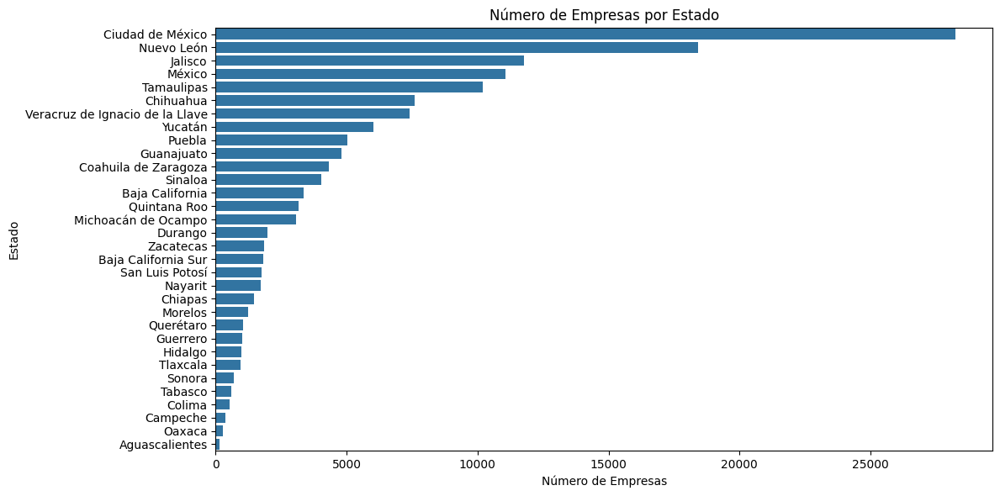

In [12]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df_siem, y='estado', order=df_siem['estado'].value_counts().index)
plt.title('Número de Empresas por Estado')
plt.xlabel('Número de Empresas')
plt.ylabel('Estado')
plt.tight_layout()
plt.show()

##### ***Visualización de la Distribución de Empresas por Rango de Empleados***

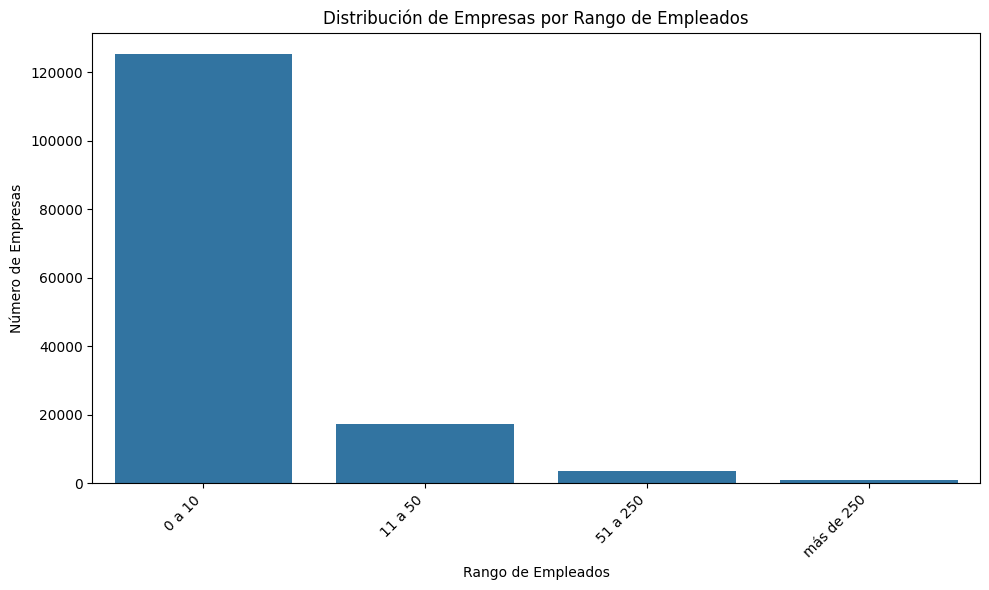

In [15]:
plt.figure(figsize=(10, 6))
sns.barplot(x=tamanio_razon_social.index, y=tamanio_razon_social.values)
plt.title('Distribución de Empresas por Rango de Empleados')
plt.xlabel('Rango de Empleados')
plt.ylabel('Número de Empresas')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()